In [1]:
import pandas as pd
import os
import matplotlib.pyplot as plt
import numpy as np

path = "/Users/ziedbk/Desktop/group01/datasets"
df_apple = pd.read_csv(path+'/mobility/apple.csv')

In [ ]:
transportation_type = "transit"
country = ["Germany", "France", "Austria", "Spain", "Italy", "Croatia", "Poland"]

df_filtered_apple = df_apple[(df_apple.transportation_type==transportation_type) & (df_apple.geo_type=="country/region") & df_apple.region.isin(country)]
df_filtered_apple = df_filtered_apple.drop(["geo_type", "transportation_type", "alternative_name", "sub-region", "country"], axis=1)
#df_filtered = df_filtered.melt(id_vars="region", var_name=["date"])
df_filtered_apple = df_filtered_apple.pivot_table(columns='region')
df_filtered_apple = df_filtered_apple.fillna(method="ffill")

In [3]:
from sklearn.preprocessing import PolynomialFeatures
from sklearn.pipeline import make_pipeline
from sklearn.linear_model import LinearRegression

def predict(y,level):
    x = np.linspace(0, 49, num=49)
    x2 = np.linspace(0, 51, num=51)
    poly = PolynomialFeatures(9, include_bias=False)
    poly.fit_transform(x[:, None])
    poly_model = make_pipeline(PolynomialFeatures(level),
                               LinearRegression())
    poly_model.fit(x[:, np.newaxis], y)
    y_predicted = poly_model.predict(x2[:, np.newaxis])
    return y_predicted

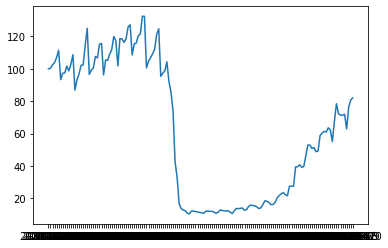

In [4]:
plt.plot(df_filtered_apple['France'])

## The work starts hier.
What we want to do is to is to predict the CO2 emission per country for 2019 and 2020 from the 1970-2018 emissions (time series)
The first try will be a polynomial regression:

## The list of available countrys

In [5]:
df_CO2 = pd.read_csv(path+'/greenhouse/co2_country_edgar.csv')
print(df_CO2['country_name'].to_csv())

,country_name
0,Afghanistan
1,Albania
2,Algeria
3,Angola
4,Anguilla
5,Antigua and Barbuda
6,Argentina
7,Armenia
8,Aruba
9,Australia
10,Austria
11,Azerbaijan
12,Bahamas
13,Bahrain
14,Bangladesh
15,Barbados
16,Belarus
17,Belgium
18,Belize
19,Benin
20,Bermuda
21,Bhutan
22,Bolivia
23,Bosnia and Herzegovina
24,Botswana
25,Brazil
26,British Virgin Islands
27,Brunei
28,Bulgaria
29,Burkina Faso
30,Burundi
31,Cambodia
32,Cameroon
33,Canada
34,Cape Verde
35,Cayman Islands
36,Central African Republic
37,Chad
38,Chile
39,China
40,Colombia
41,Comoros
42,Congo
43,Cook Islands
44,Costa Rica
45,Côte d’Ivoire
46,Croatia
47,Cuba
48,Curaçao
49,Cyprus
50,Czechia
51,Democratic Republic of the Congo
52,Denmark
53,Djibouti
54,Dominica
55,Dominican Republic
56,Ecuador
57,Egypt
58,El Salvador
59,Equatorial Guinea
60,Eritrea
61,Estonia
62,Eswatini
63,Ethiopia
64,Falkland Islands
65,Faroes
66,Fiji
67,Finland
68,France and Monaco
69,French Guiana
70,French Polynesia
71,Gabon
72,Georgia
73,Germany
74,Ghana
75,Gibr

## Here we predict the global emissions for 2019 2020, (polynomial lvl = 9, with is explained in the next section)

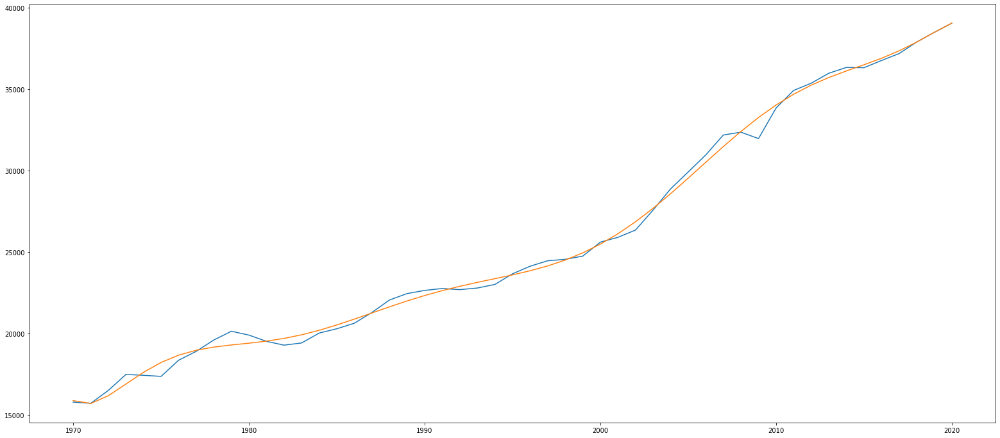

In [6]:
#df_CO2.iloc[2]
years = np.linspace(1970, 2020, 51)
global_co2 = df_CO2.loc[df_CO2['country_name'] == 'GLOBAL TOTAL']

global_co2 = global_co2.iloc[0][1:].str.replace(',', '.', regex=True).astype(float)
plt.figure(figsize=(27, 12))
global_predicted = predict(global_co2,9)
global_predicted = pd.Series(global_predicted)
global_co2 = pd.concat([global_co2, global_predicted.iloc[-2:]])
plt.plot(years, global_co2)
plt.plot(years, global_predicted)


## train 15 polynoms with 15 different levels to find the best model; the lest error was with level = 9

[174896.32419815  66457.08585575  29301.18934026  25068.24547416
  21892.98055039  14802.71398661  12577.07764056  12286.06104609
   9195.01878047   8993.29416446   8802.88783525  11537.26625998
  11997.40325195  12779.1527412   13718.58682737  14587.58691124]


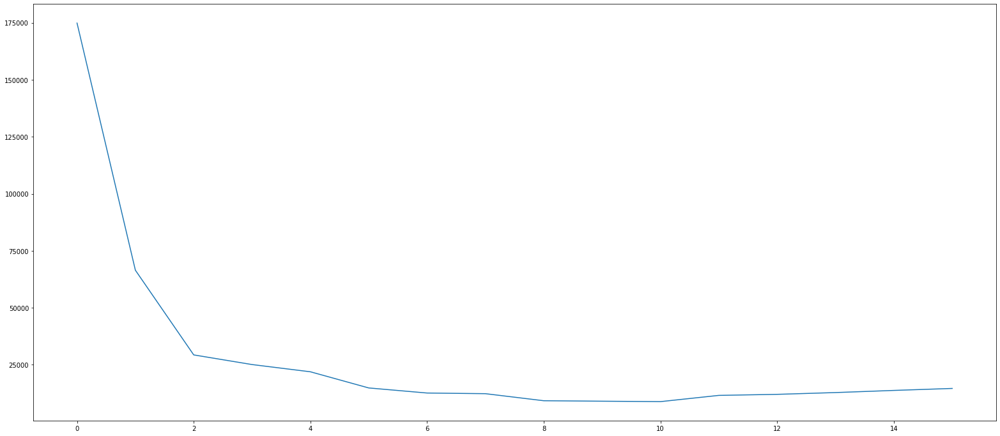

In [7]:
from sklearn.preprocessing import PolynomialFeatures
from sklearn.pipeline import make_pipeline
from sklearn.linear_model import LinearRegression
error =np.zeros((16,213))

data_co2 =[None] * 213
x = np.linspace(0, 49, num=49)
x2 = np.linspace(0, 51, num=51)
for i in range (np.size(df_CO2['country_name'])):
    data_co2[i] = df_CO2.loc[df_CO2['country_name'] == df_CO2['country_name'][i]]

for i in range (np.size(df_CO2['country_name'])-150):
    #plt.figure(i)
    #fig = plt.figure(figsize=(27, 12))
    y = data_co2[i].iloc[0][1:].str.replace(',', '.', regex=True).astype(float)
    for ii in range (16):
        y_predicted = predict(y,ii)
        error[ii,i] = (sum(abs(y_predicted[:49]-y)))
print(np.sum(error,axis=1))
fig = plt.figure(figsize=(27, 12))
plt.plot(np.sum(error,axis=1))


## country emission precdiction

/Users/ziedbk/Library/Python/3.7/lib/python/site-packages/ipykernel_launcher.py:5: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  """
/Users/ziedbk/Library/Python/3.7/lib/python/site-packages/ipykernel_launcher.py:5: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  """
/Users/ziedbk/Library/Python/3.7/lib/python/site-packages/ipykernel_launcher.py:5: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (T

IndexError: single positional indexer is out-of-bounds

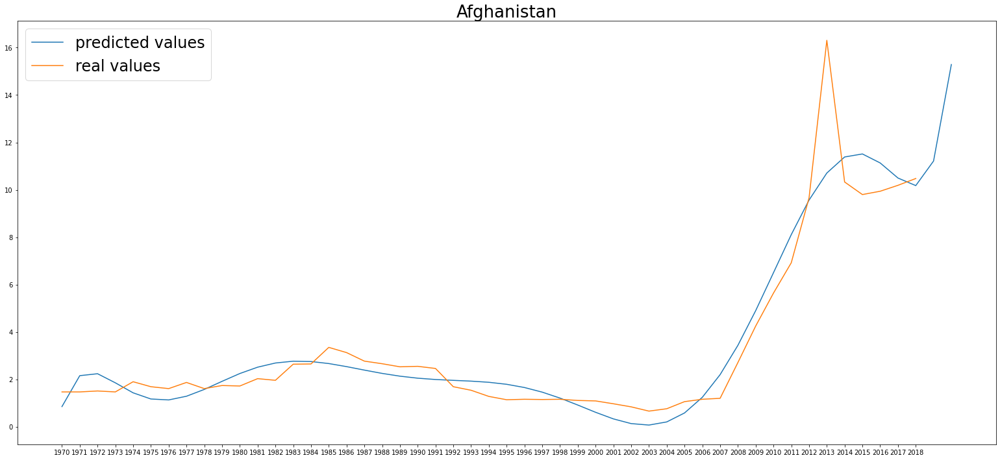

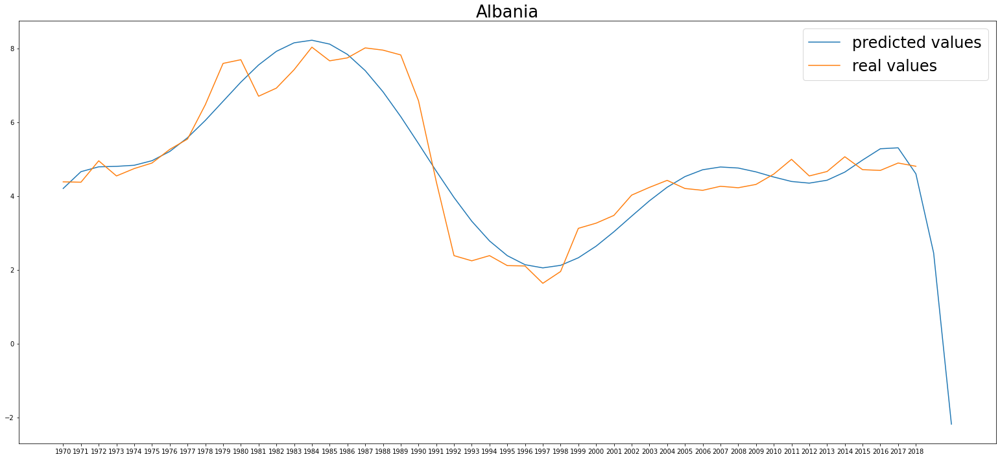

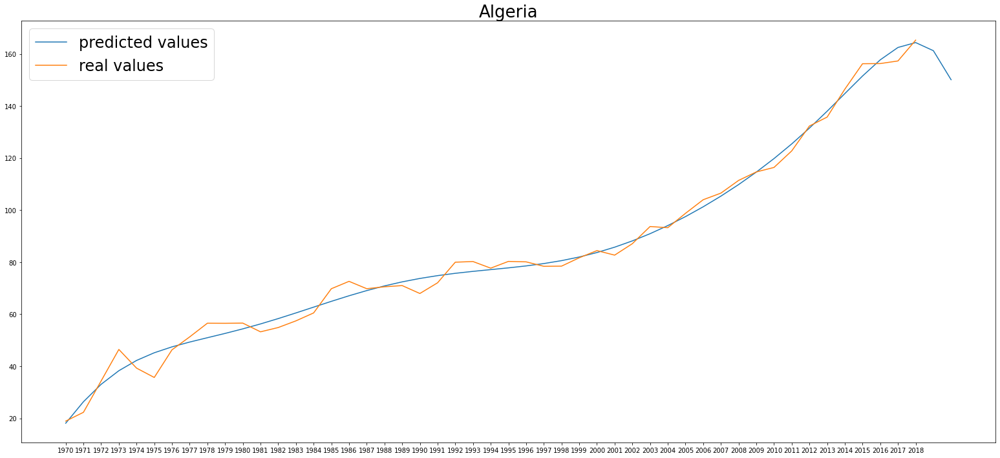

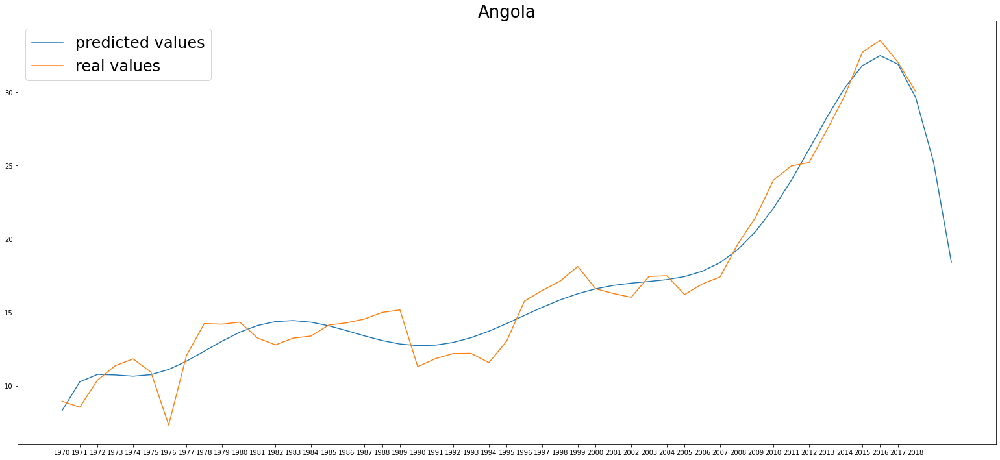

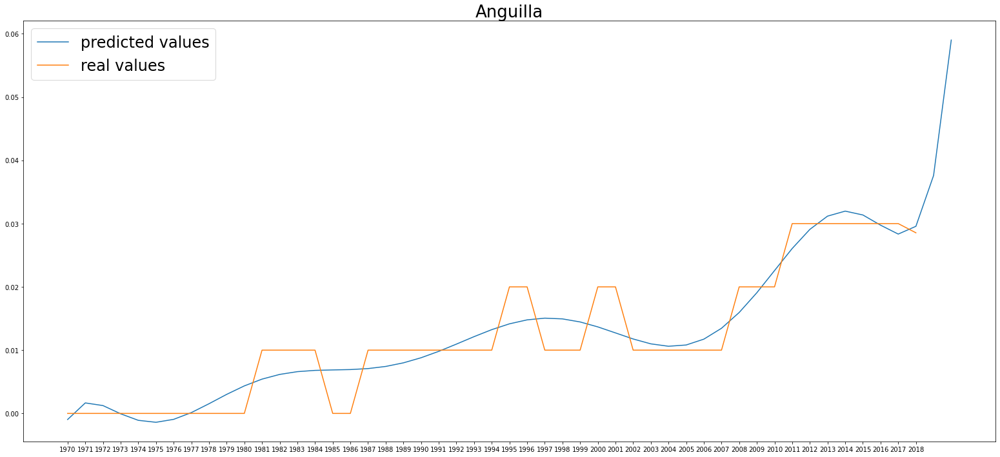

...

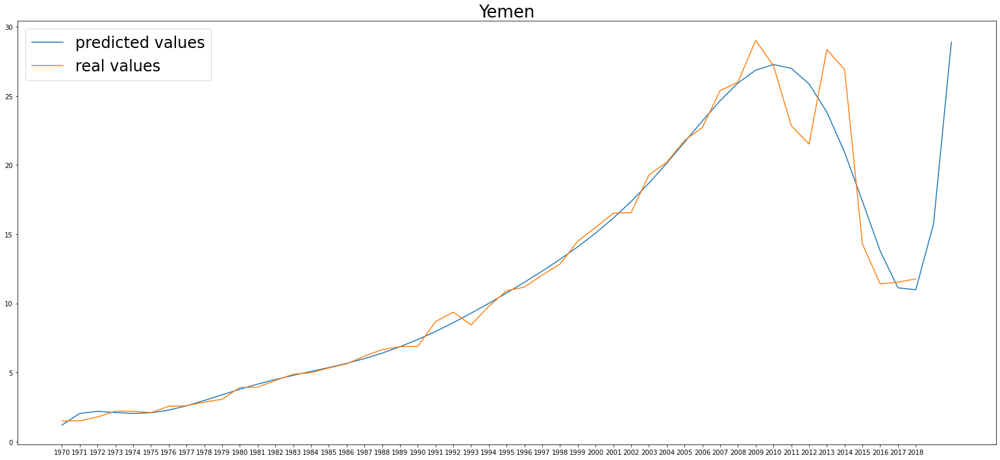

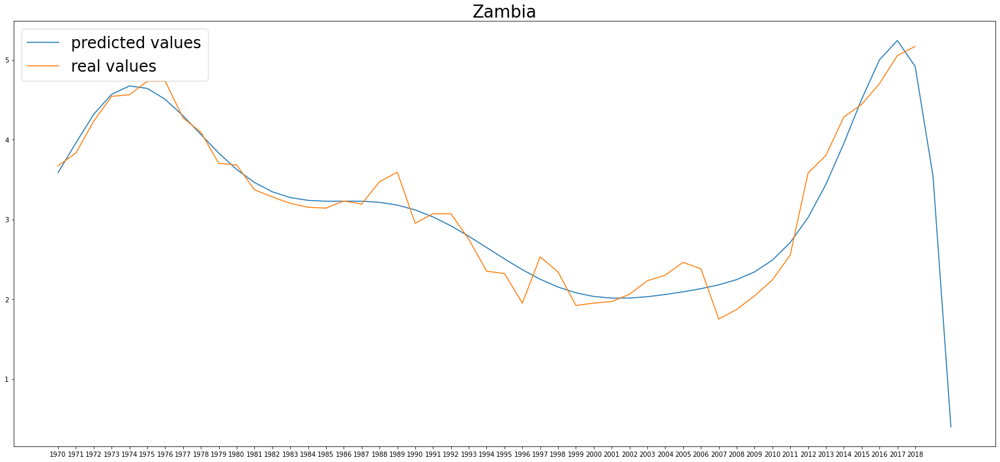

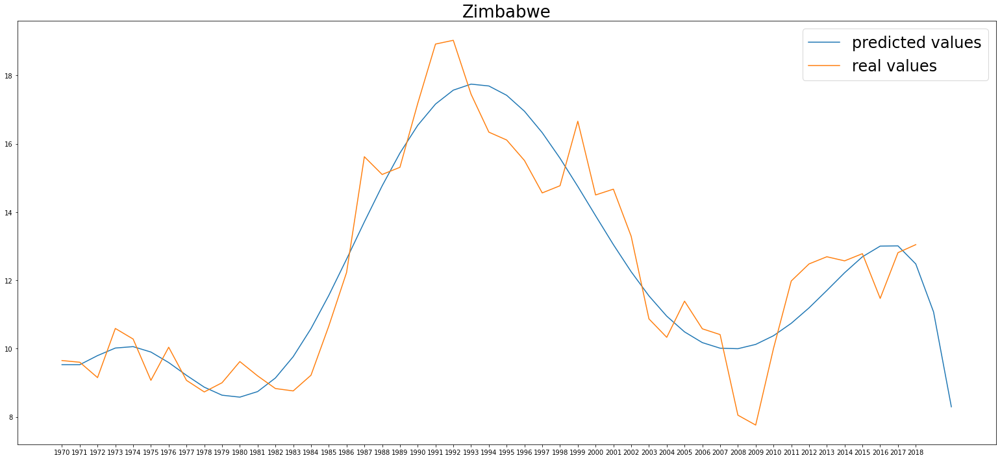

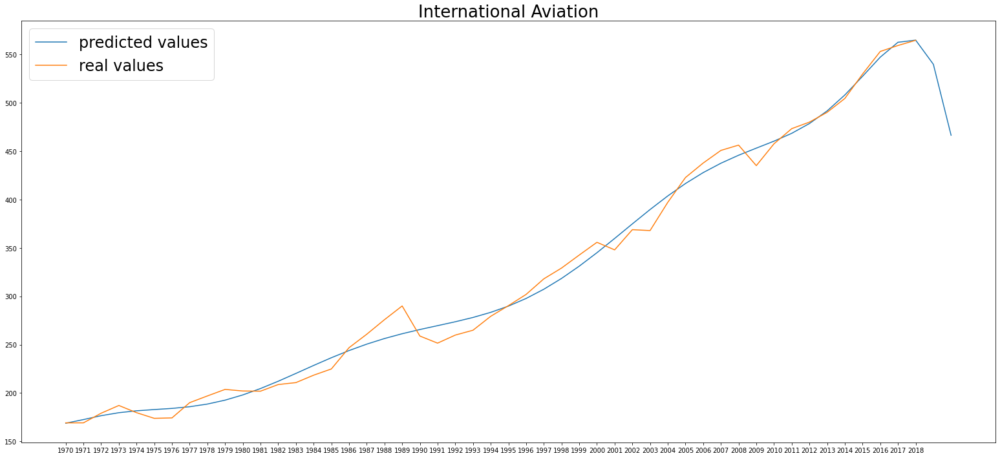

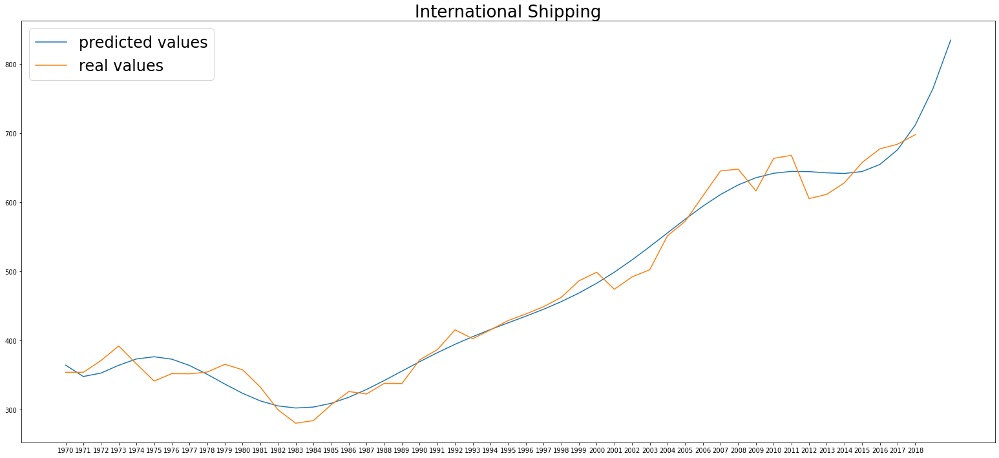

In [9]:
from operator import truediv
for i in range (np.size(df_CO2['country_name'])-1): # delete 190 country from the array to limit the plots
    y = (data_co2[i].iloc[0][1:].str.replace(',', '.', regex=True).astype(float)) # strings to floats
    y_predicted = predict(y,9)
    fig = plt.figure(figsize=(27, 12))
    plt.plot(y_predicted)
    plt.plot(y)
    plt.title(data_co2[i]['country_name'].any(), fontsize=26)
    plt.legend(['predicted values', 'real values'], fontsize=24)

## The models looks nice the known value, and break for values to predict when the evolution is not stable.
let's try to do the same separating the sectors of emissions

In [9]:
import pandas as pd
import os
import matplotlib.pyplot as plt
import numpy as np

path = "/Users/ziedbk/Desktop/group01/datasets"
df = pd.read_csv(path+'/greenhouse/co2_country_sector_edgar.csv')

for i in range(df.size):
    co2_country = df.loc[df['country_name'] == 'Australia']
for i in range (np.shape(co2_country)[0]):
    co2_country.iloc[i][2:] = (co2_country.iloc[i][2:].str.replace(',', '.', regex=True).astype(float))
co2_country

,Sector,country_name,1970,1971,1972,1973,1974,1975,1976,1977,...,2009,2010,2011,2012,2013,2014,2015,2016,2017,2018
9,Power Industry,Australia,53.23,52.45,57.96,59.16,65.23,69.45,71.82,80.8,...,222.2,210.67,202.7,201.73,191.44,182.31,190.37,194.47,189.11,186.621
216,Buildings,Australia,10.51,10.97,11.11,13.22,10.93,11.54,11.39,11.91,...,18.53,18.81,19.09,19.33,19.63,20.23,21.09,21.69,21.75,22.2481
422,Transport,Australia,32.48,33.37,34.34,38.07,39.16,40.72,42.02,44.74,...,85.01,87.61,90.25,90.91,92.35,92.51,94.73,96.14,97.85,102.103
629,Other industrial combustion,Australia,45.92,46.97,45.43,47.73,57.8,58.35,57.3,59.16,...,70.21,71.95,75,74.49,78.98,78.22,74.66,80.94,80.43,81.4064
835,Other sectors,Australia,18.82,18.5,19.31,19.63,13.9,13.81,14.13,13.28,...,21.1,23.8,23.34,22.45,22.01,21.63,21.1,22.14,22.43,22.9308


## Plots the different emissions according to the sector

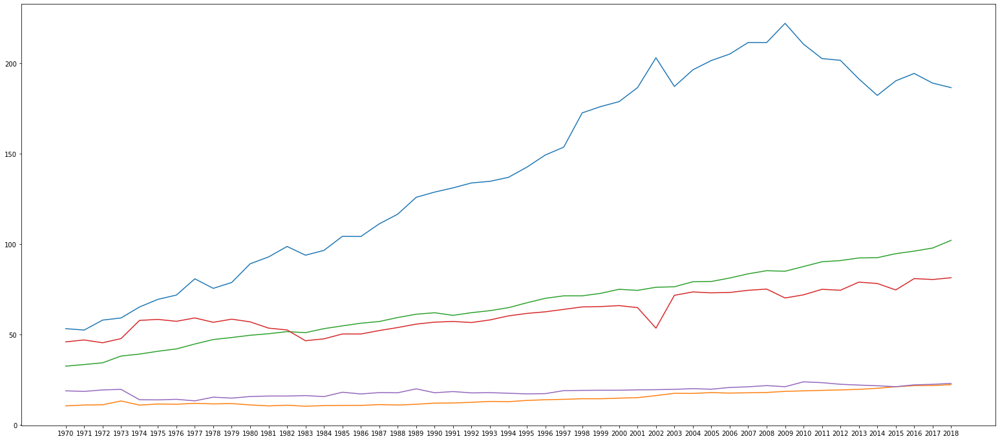

In [10]:
fig = plt.figure(figsize=(27, 12))
for i in range (np.shape(co2_country)[0]):
    plt.plot(co2_country.iloc[i][2:])

## sum up the different sector

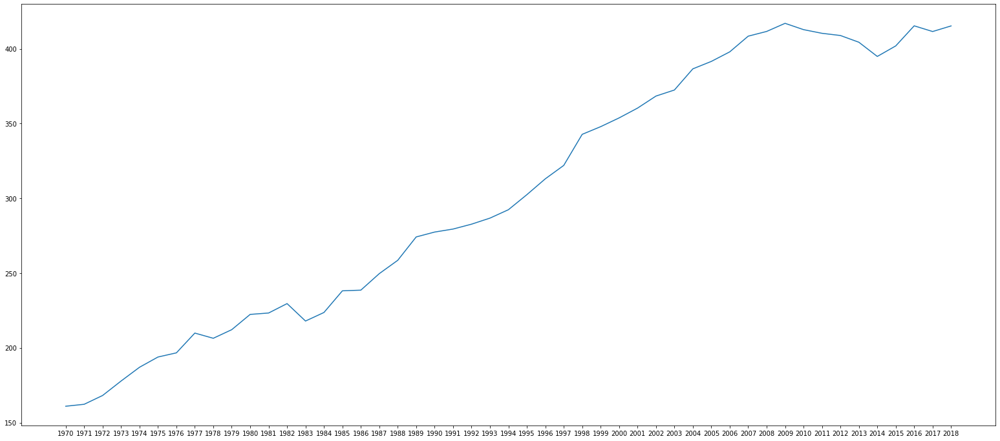

In [11]:
fig = plt.figure(figsize=(27, 12))
plt.plot(co2_country.sum(0)[2:])

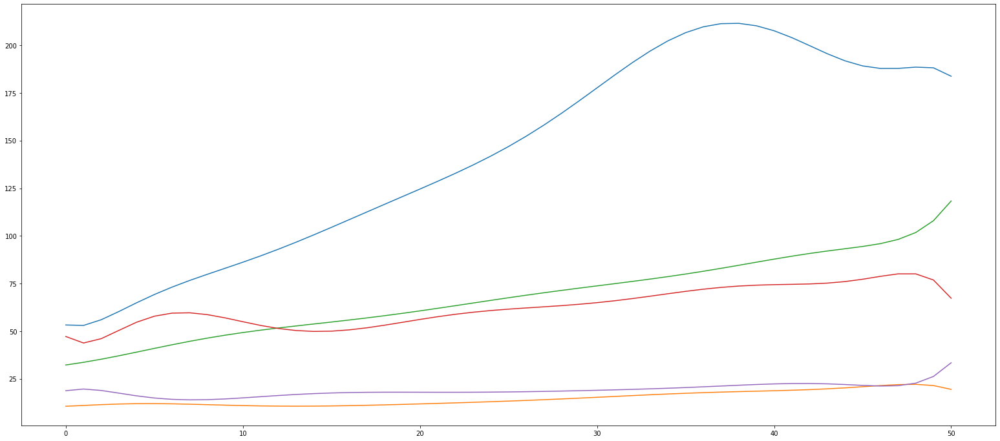

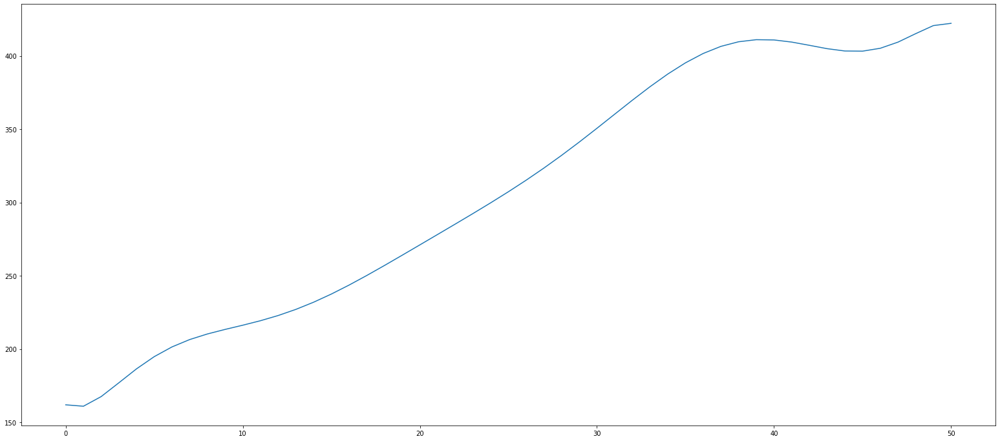

In [12]:
prediction = [None] * 5
fig = plt.figure(figsize=(27, 12))
for i in range (np.shape(co2_country)[0]):
    y = co2_country.iloc[i][2:]
    prediction[i] = predict(y,9)
    plt.plot(prediction[i])
fig = plt.figure(figsize=(27, 12))
prediction = np.array(prediction)
plt.plot(prediction.sum(axis=0))

## training the global emission of a country of traning the emission of different sector and sum up the results delieve exactly the same results

## plot the distribution of the emission data and the distribution of the prefiction

/Users/ziedbk/Library/Python/3.7/lib/python/site-packages/seaborn/axisgrid.py:1668: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(height, height))
/Users/ziedbk/Library/Python/3.7/lib/python/site-packages/ipykernel_launcher.py:10: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  # Remove the CWD from sys.path while we load stuff.
/Users/ziedbk/Library/Python/3.7/lib/python/site-packages/ipykernel_launcher.py:14: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.

<Figure size 432x288 with 0 Axes>

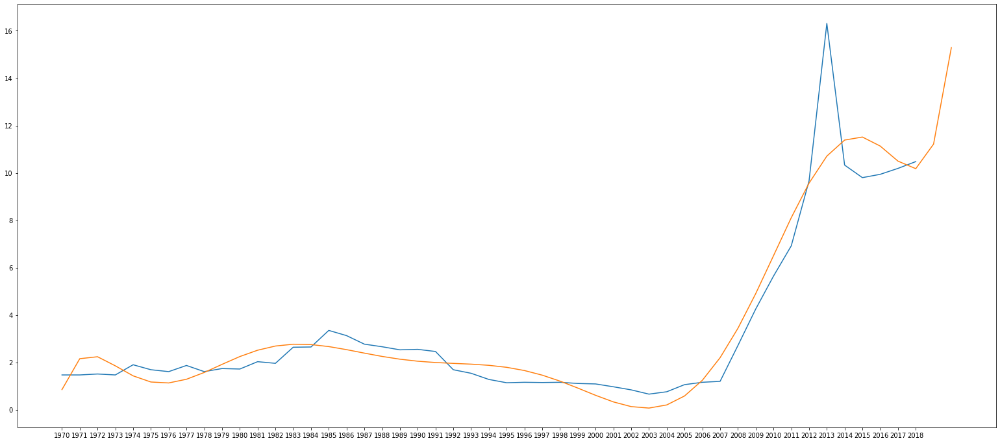

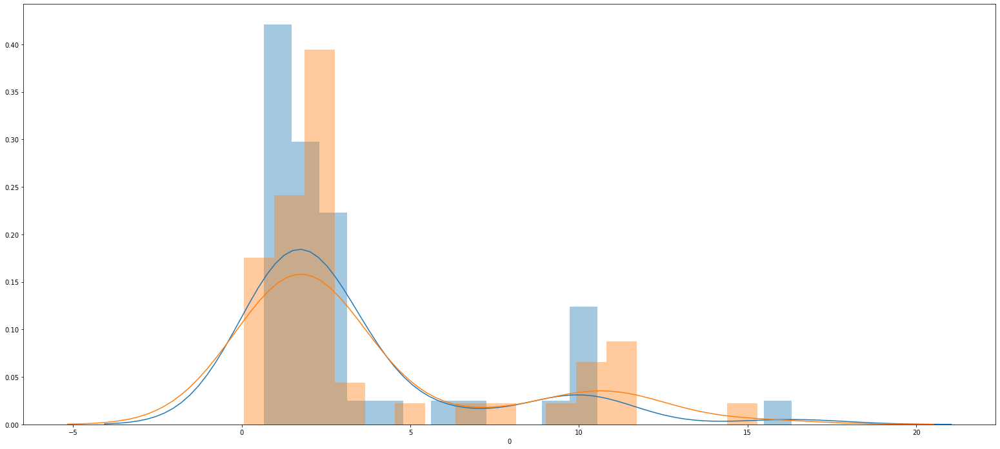

<Figure size 1944x864 with 0 Axes>

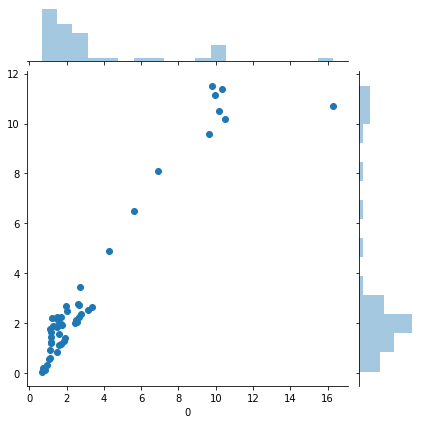

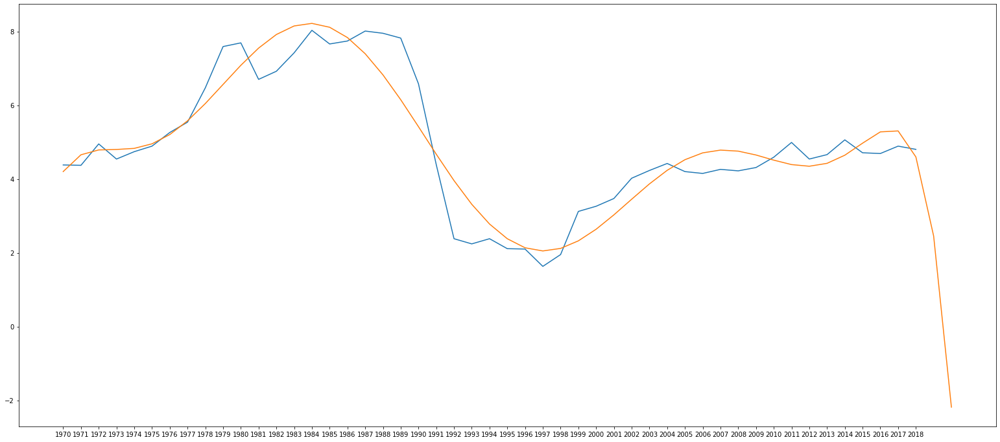

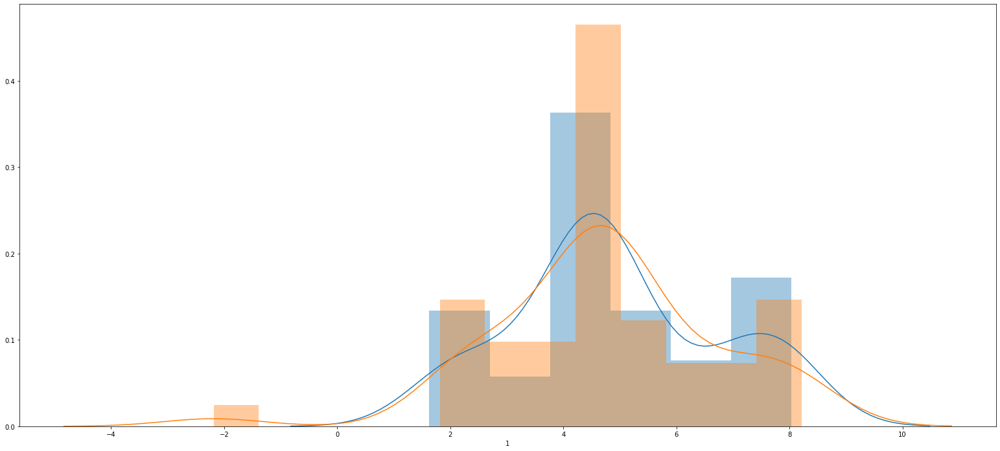

<Figure size 1944x864 with 0 Axes>

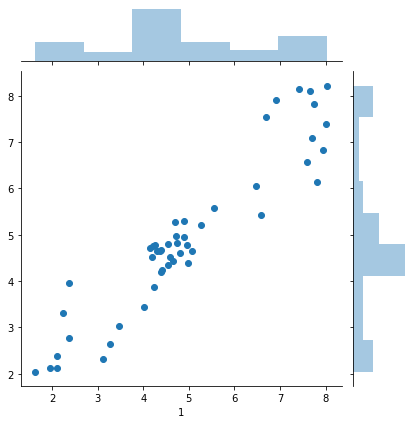

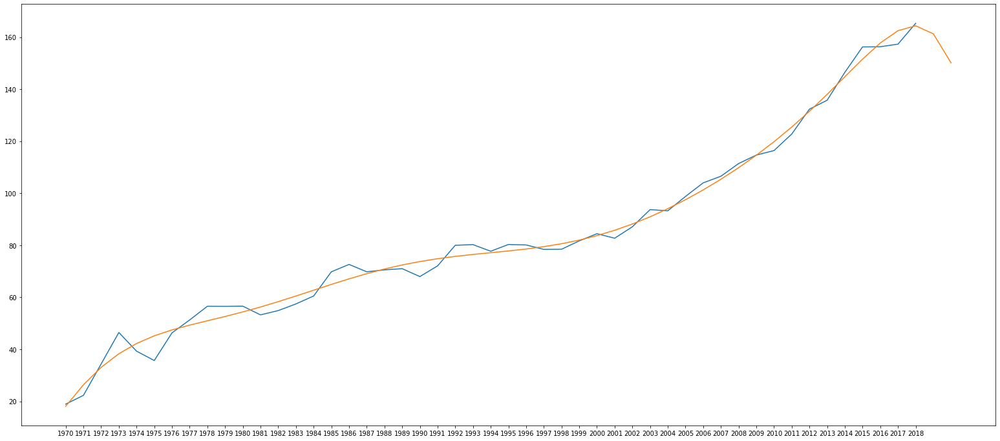

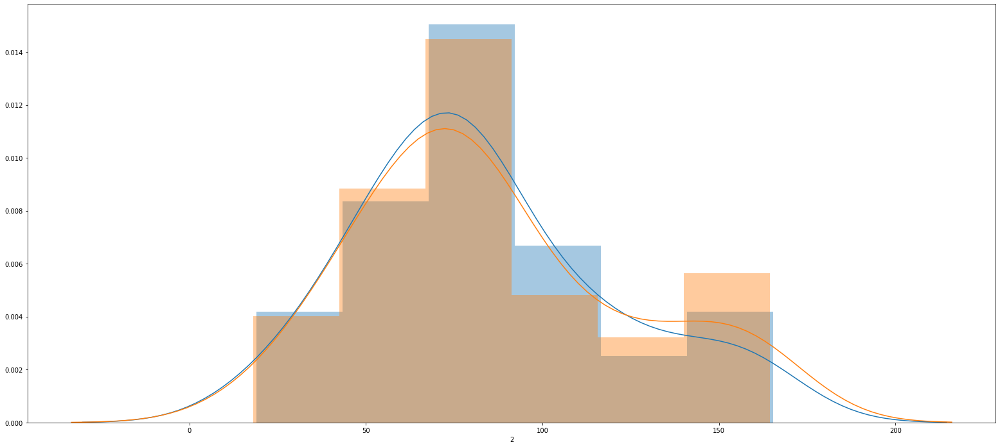

<Figure size 1944x864 with 0 Axes>

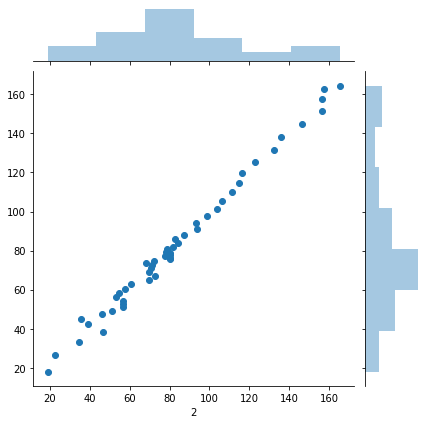

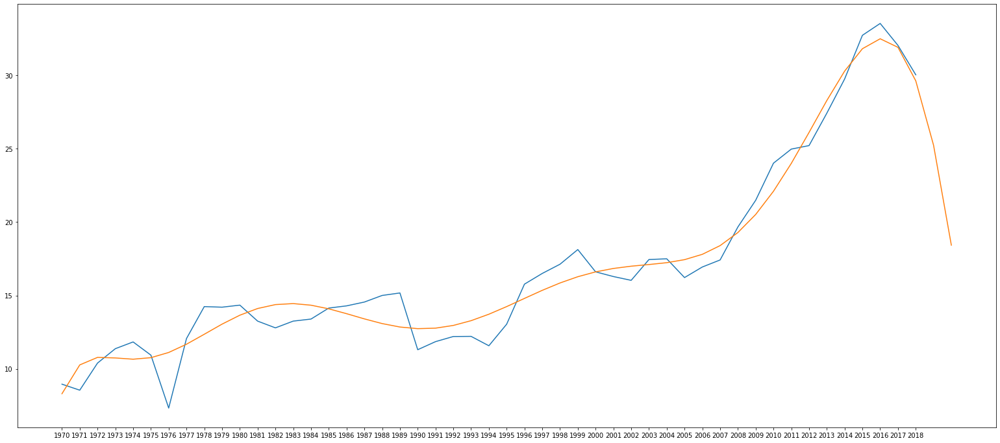

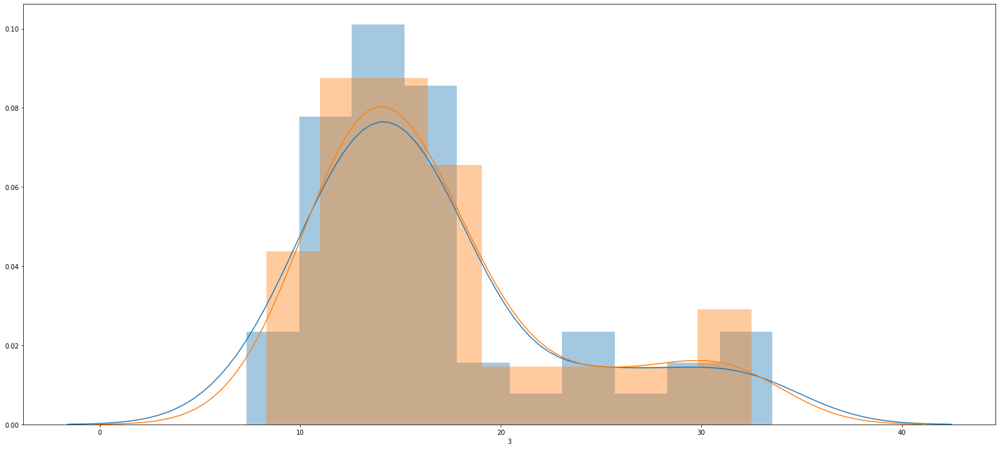

<Figure size 1944x864 with 0 Axes>

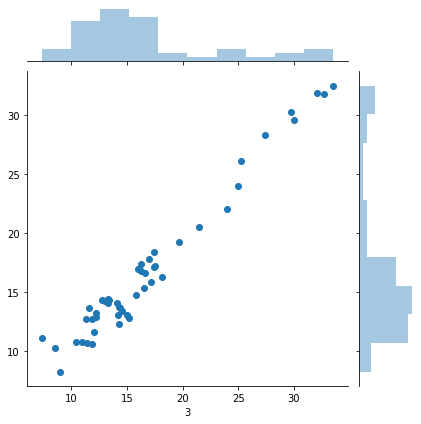

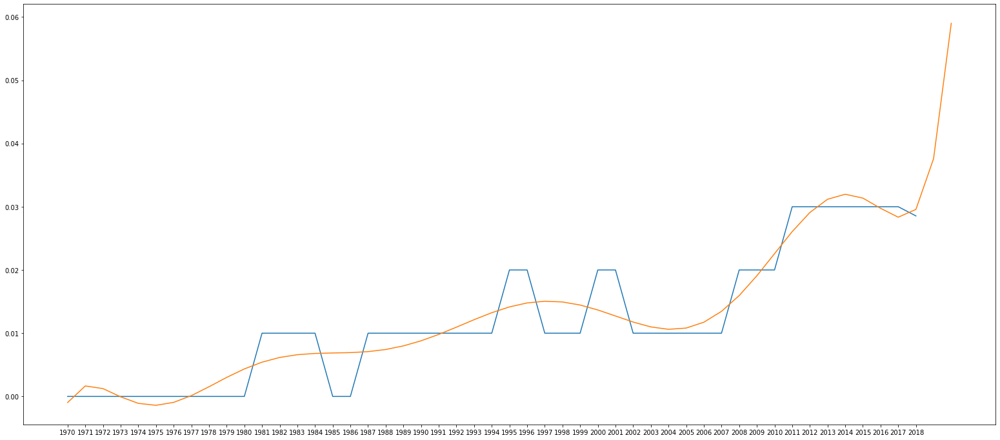

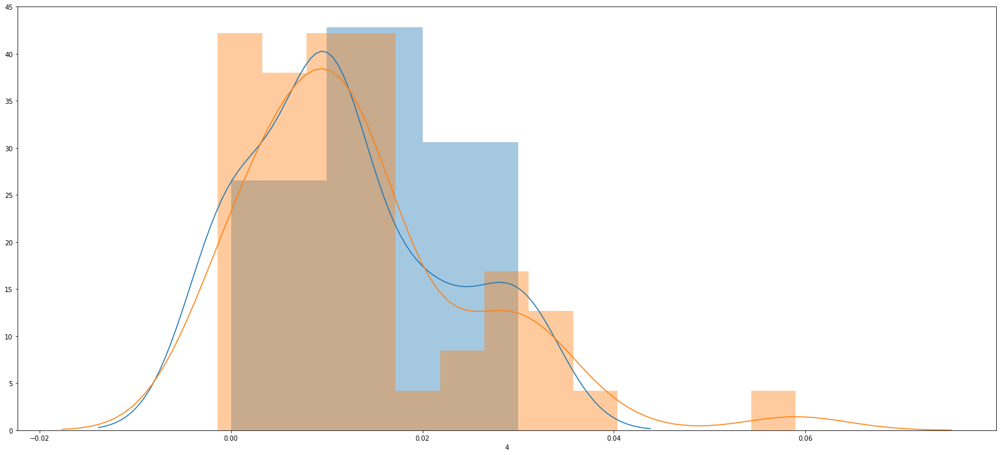

<Figure size 1944x864 with 0 Axes>

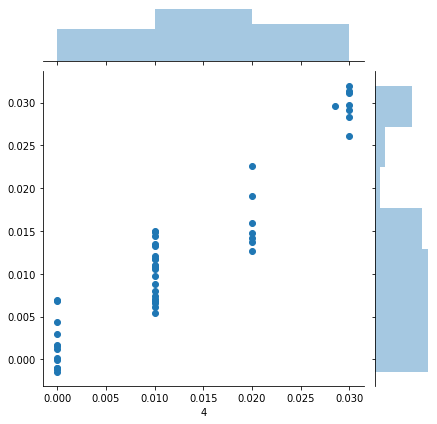

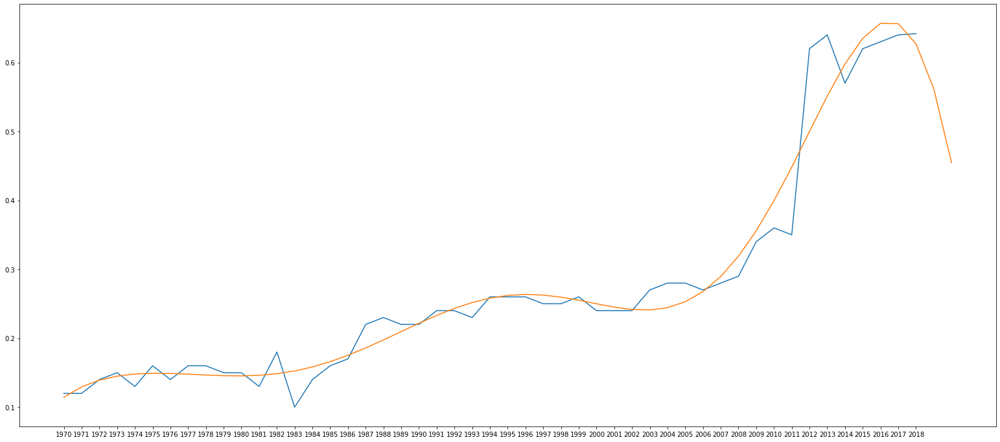

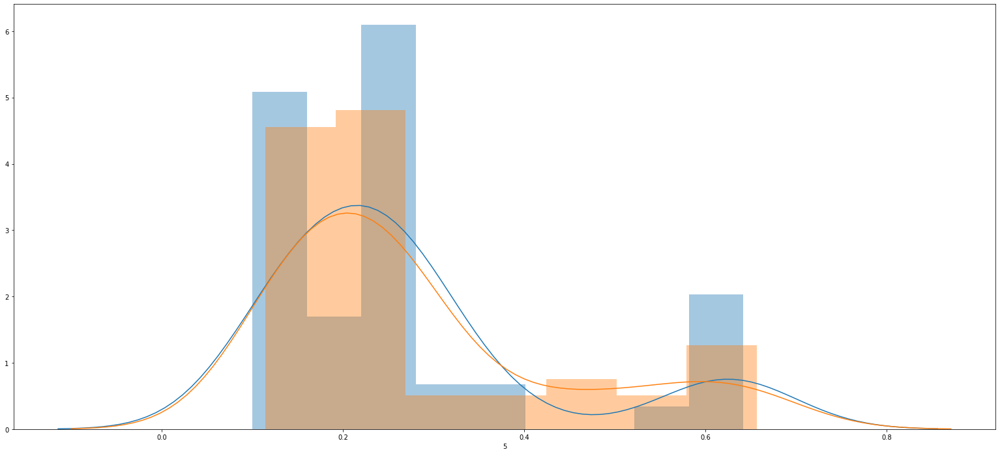

<Figure size 1944x864 with 0 Axes>

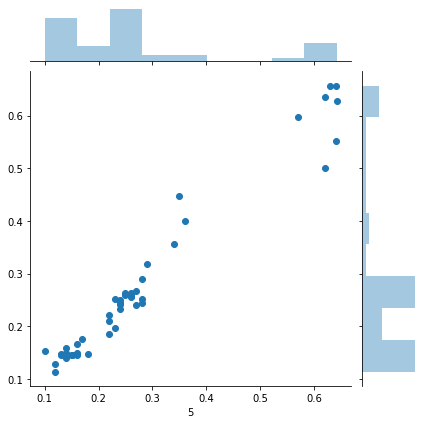

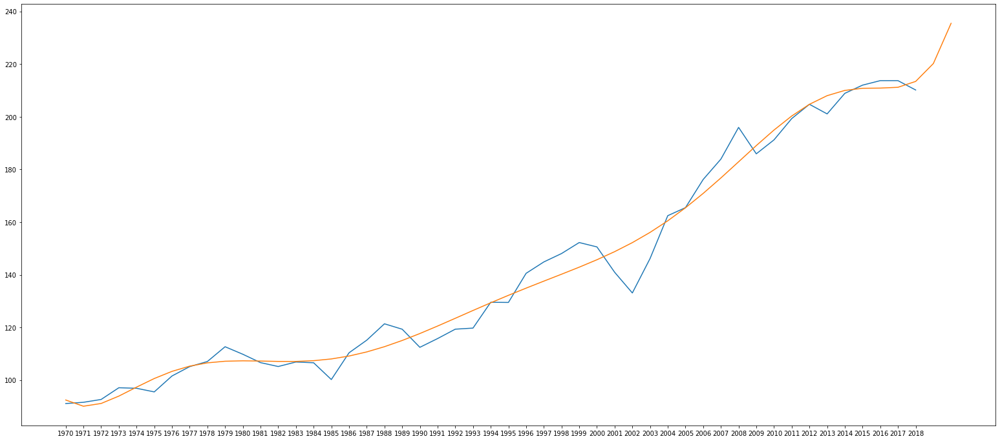

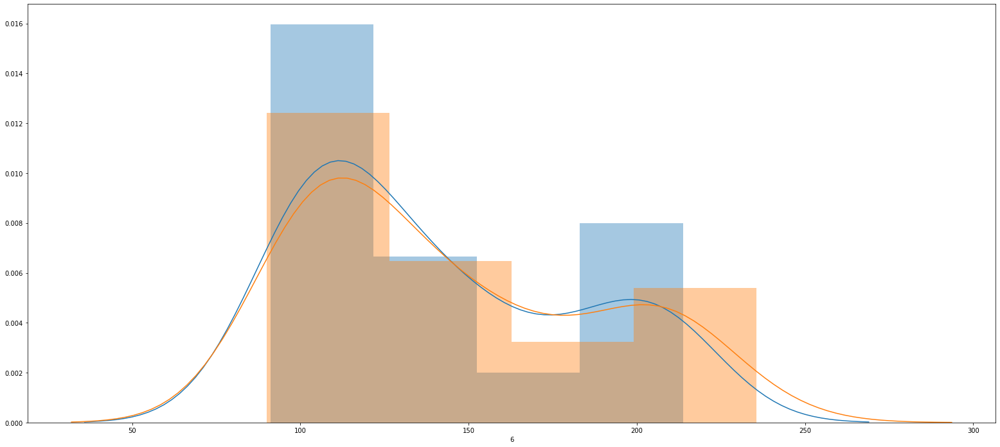

<Figure size 1944x864 with 0 Axes>

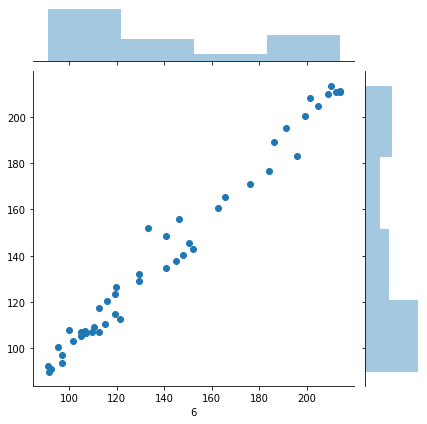

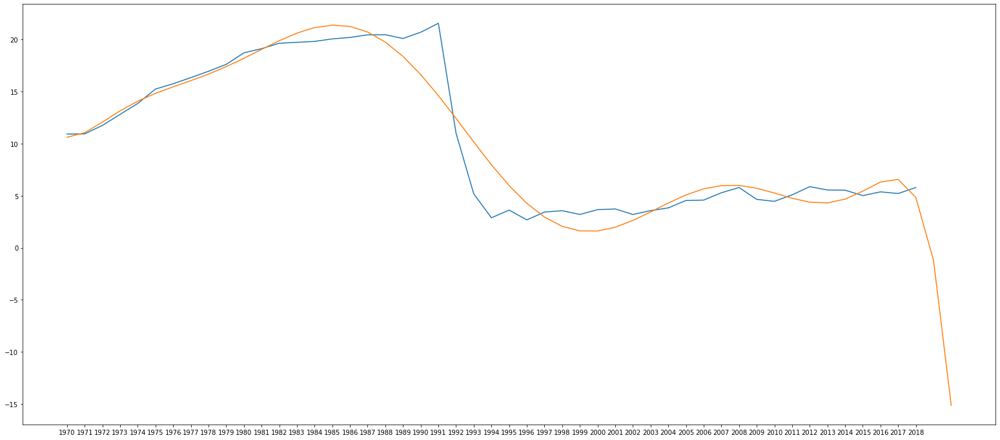

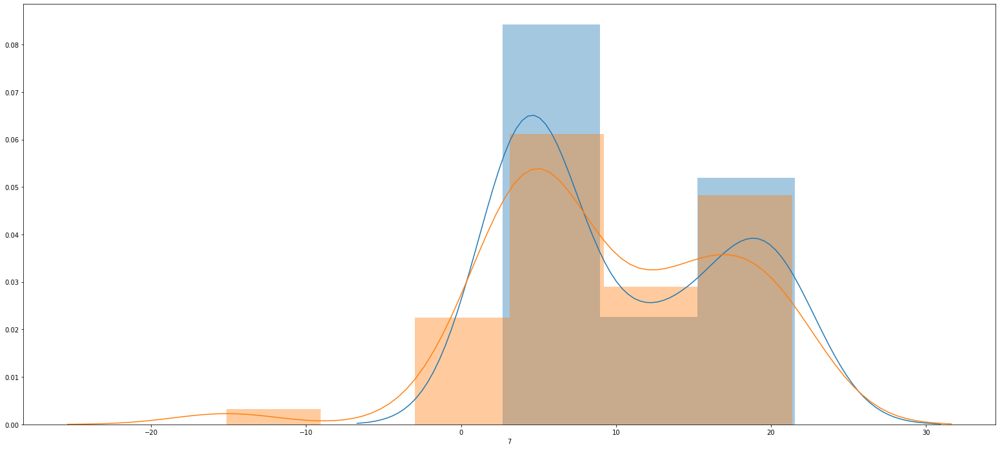

<Figure size 1944x864 with 0 Axes>

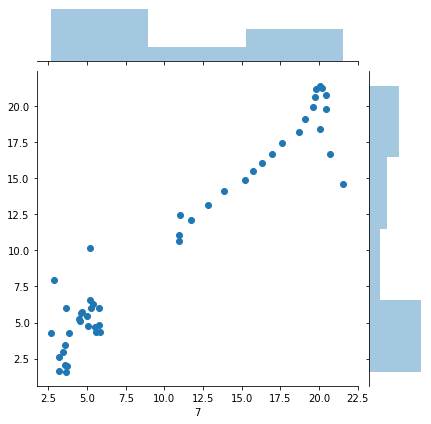

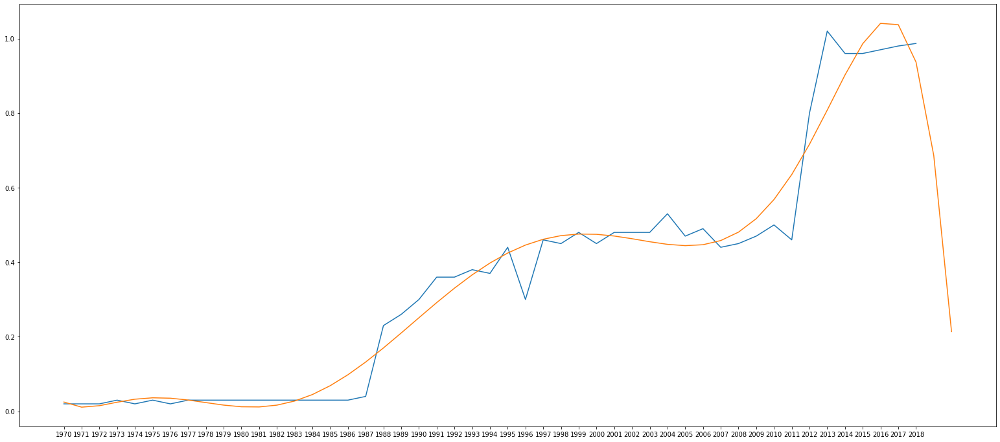

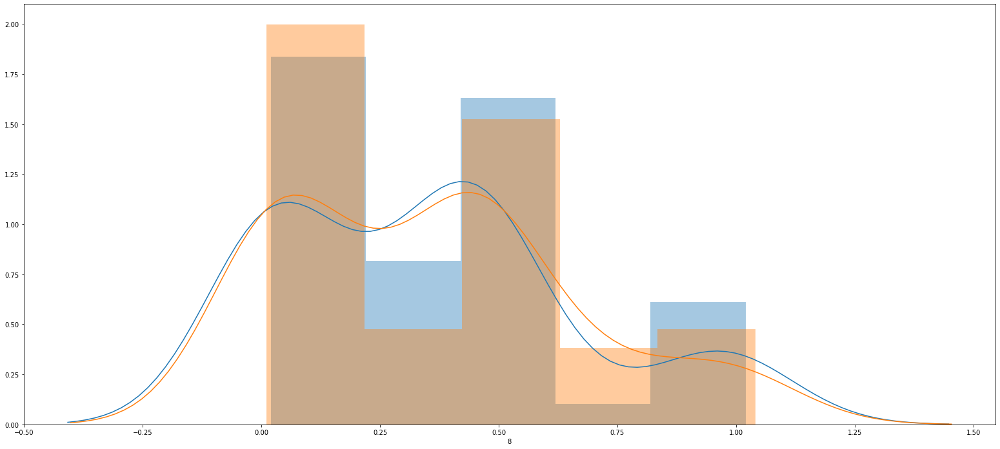

<Figure size 1944x864 with 0 Axes>

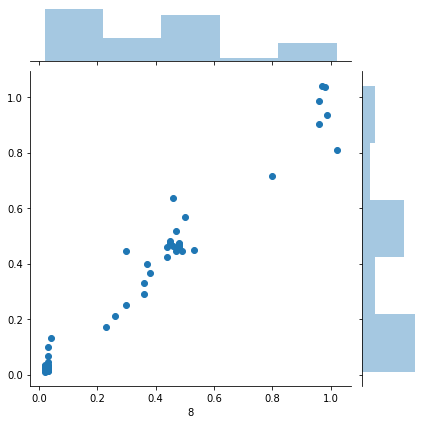

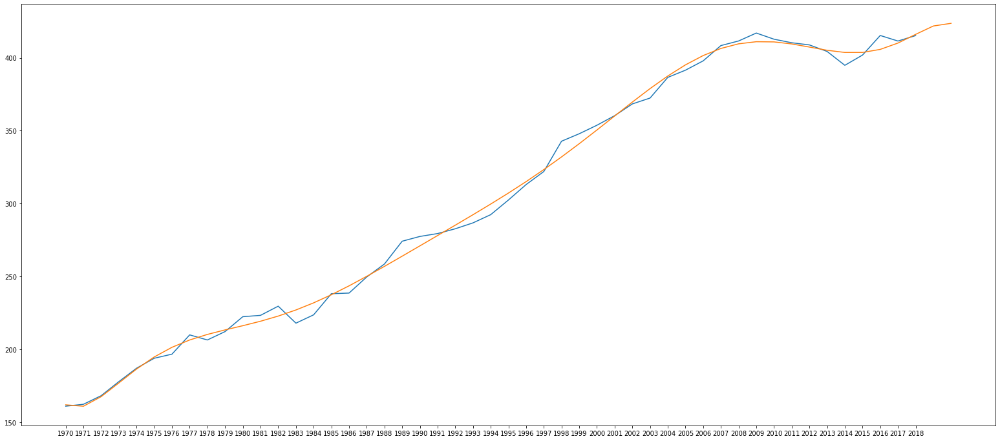

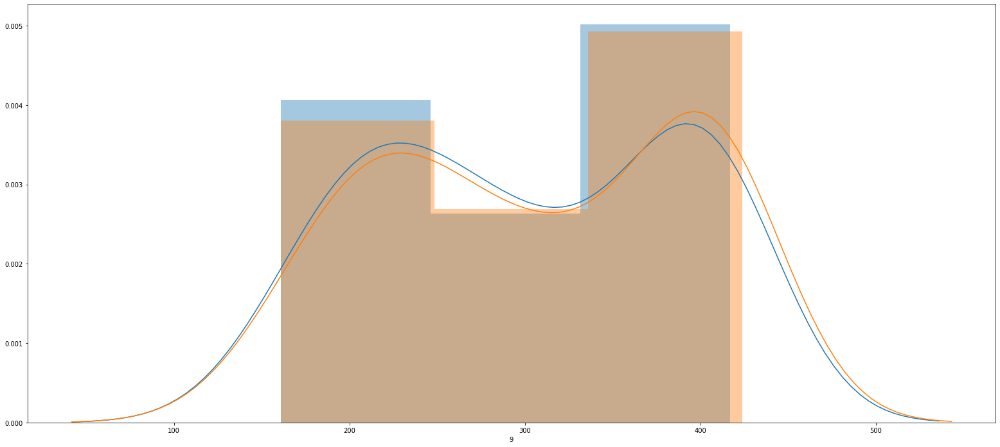

<Figure size 1944x864 with 0 Axes>

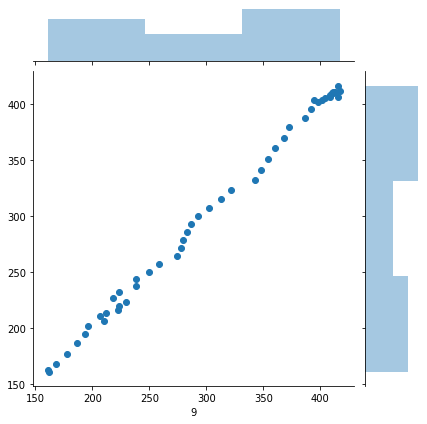

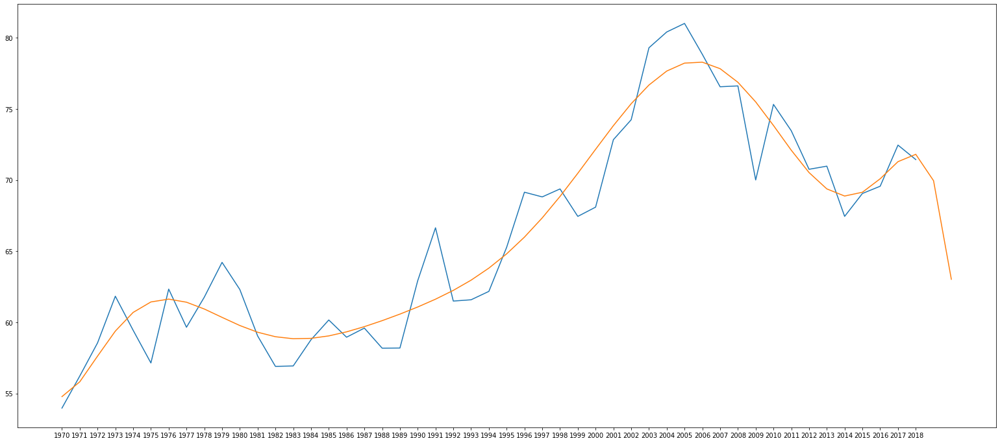

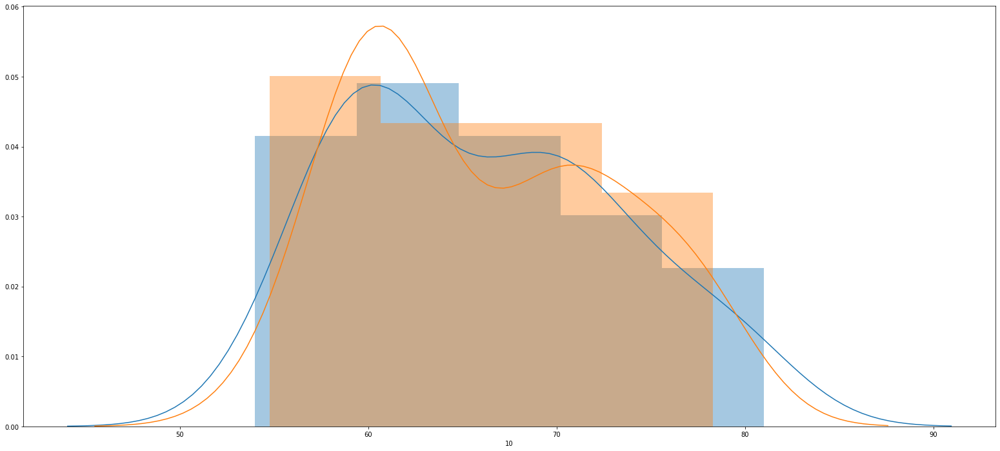

<Figure size 1944x864 with 0 Axes>

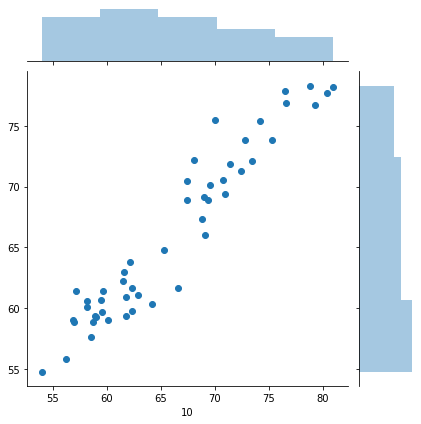

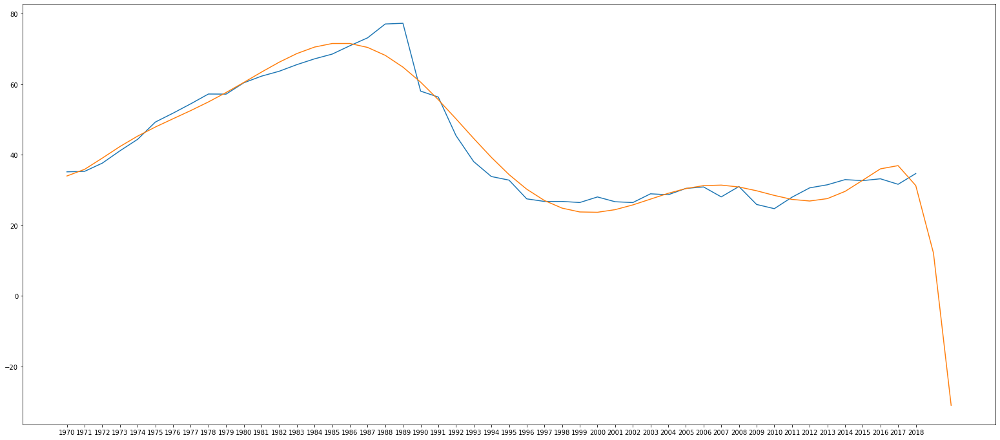

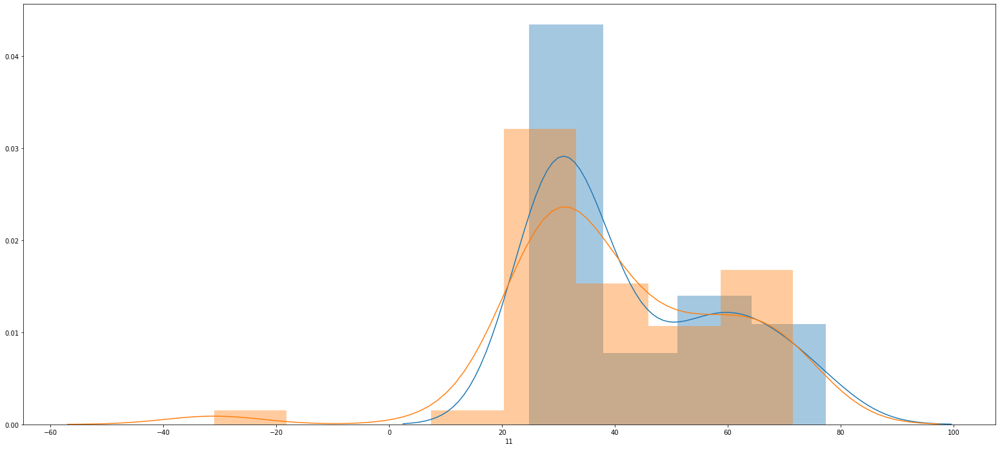

<Figure size 1944x864 with 0 Axes>

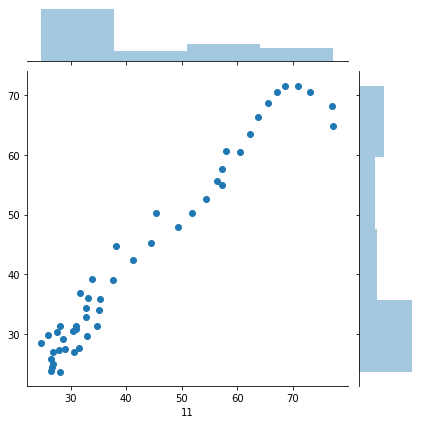

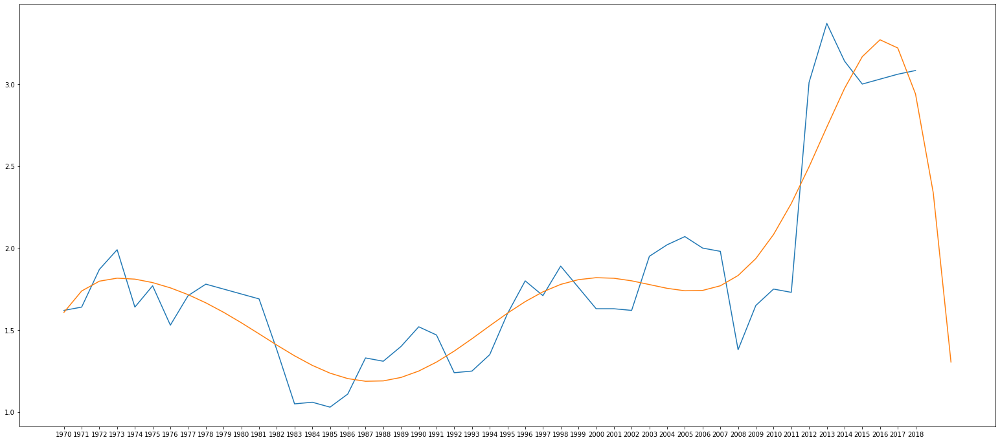

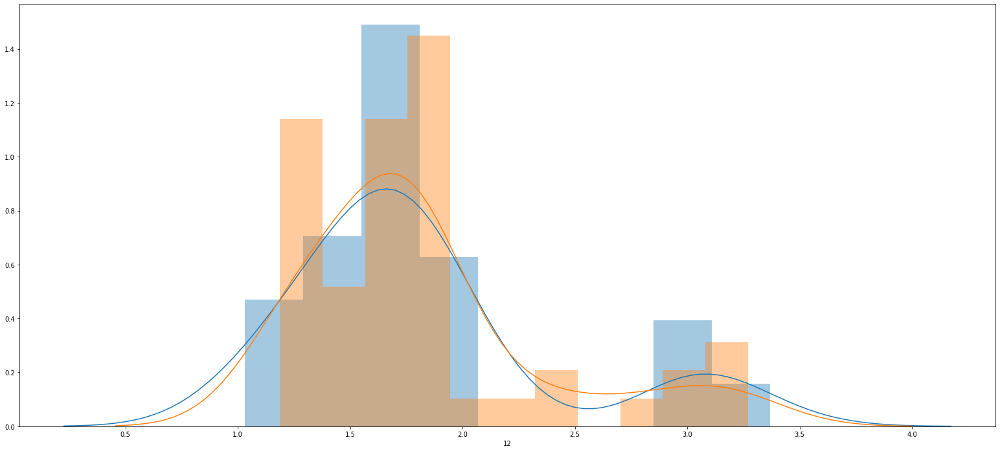

<Figure size 1944x864 with 0 Axes>

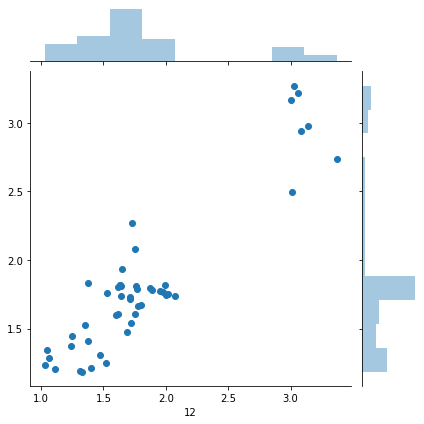

In [13]:
import seaborn as sns
count = 0
for i in range (np.size(df_CO2['country_name'])-200):

    y = (data_co2[i].iloc[0][1:].str.replace(',', '.', regex=True).astype(float))
    y_predicted = predict(y,9)

    count = count + 3
    plt.figure(count)
    fig = plt.figure(figsize=(27, 12))
    plt.plot(y)
    plt.plot(y_predicted)
    plt.figure(count+1)
    fig = plt.figure(figsize=(27, 12))
    sns.distplot(y);
    sns.distplot(y_predicted)
    plt.figure(count+2)
    plt.figure(figsize=(27, 12))
    sns.jointplot(y, y_predicted[:49]);

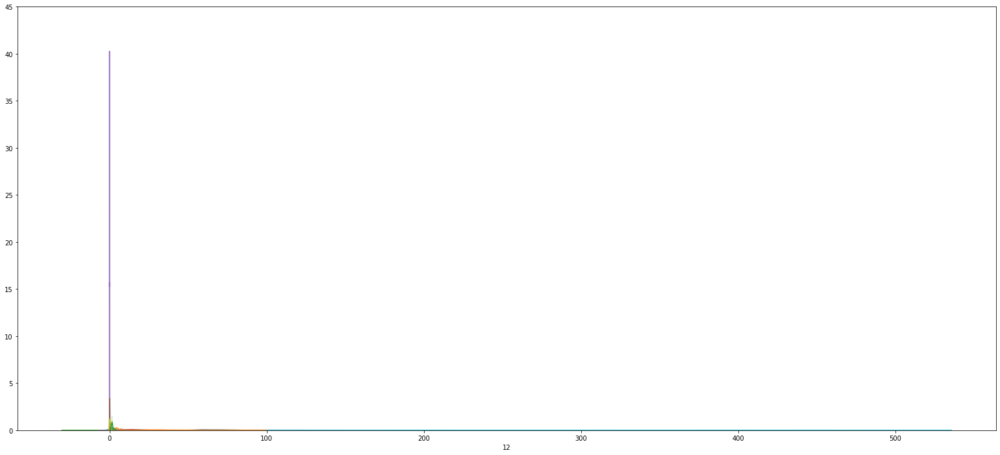

In [14]:
plt.figure(figsize=(27, 12))
for i in range (np.size(df_CO2['country_name'])-200):
    y = (data_co2[i].iloc[0][1:].str.replace(',', '.', regex=True).astype(float))
    sns.distplot(y)
    

In [15]:
list =[[],[]]
for i in range (np.size(df_CO2['country_name'])-100):

    y = (data_co2[i].iloc[0][1:].str.replace(',', '.', regex=True).astype(float))
    for ii in range (i, np.size(df_CO2['country_name'])-100):
        if (i != ii):
            yy = (data_co2[ii].iloc[0][1:].str.replace(',', '.', regex=True).astype(float))
            #plt.figure(figsize=(27, 12))
            #p = sns.jointplot(y, yy);
            #p.set_axis_labels(data_co2[i].iloc[0][0], data_co2[ii].iloc[0][0], fontsize=16)
            list[0].append(data_co2[i].iloc[0][0]+' '+data_co2[ii].iloc[0][0])
            list[1].append(np.cov(y,yy)[0][1])
            print(data_co2[i].iloc[0][0]+' '+data_co2[ii].iloc[0][0]+' '+str(np.cov(y,yy)[0][1]))
            #if (abs((np.cov(y,yy)[0][1])) < 1):
             #   plt.figure(figsize=(27, 12))
              #  p = sns.jointplot(y, yy);
               # p.set_axis_labels(data_co2[i].iloc[0][0], data_co2[ii].iloc[0][0], fontsize=16)

Afghanistan Albania 0.5357967205371194
Afghanistan Algeria 94.03727913689661
Afghanistan Angola 18.944264912710324
Afghanistan Anguilla 0.026203111037297784
Afghanistan Antigua and Barbuda 0.47904314409876847
Afghanistan Argentina 98.04213263227776
Afghanistan Armenia -4.746600370357396
Afghanistan Aruba 0.7893137430062418
Afghanistan Australia 149.76605246157743
Afghanistan Austria 5.168212863466751
Afghanistan Azerbaijan -9.783845513862676
Afghanistan Bahamas 1.61772790404356
Afghanistan Bahrain 23.924794128591195
Afghanistan Bangladesh 70.84012529213241
Afghanistan Barbados 2.493086978605806
Afghanistan Belarus -13.434999466750106
Afghanistan Belgium -27.542101145172083
Afghanistan Belize 0.2577418850506017
Afghanistan Benin 5.748860761240012
Afghanistan Bermuda 0.21615705036334376
Afghanistan Bhutan 1.481468310392271
Afghanistan Bolivia 15.594424875337035
Afghanistan Bosnia and Herzegovina 12.398497505693557
Afghanistan Botswana 4.603266471268848
Afghanistan Brazil 306.315103185699

In [16]:

list = pd.DataFrame(list)
list = list.sort_values(1,axis=1,ascending=False,)
list.transpose()


,0,1
3676,China India,2.40518e+06
3678,China Iran,676975
3677,China Indonesia,532828
2513,Brazil China,427201
3684,China Japan,328502
...,...,...
2768,Bulgaria China,-46275.1
5563,Germany India,-83185.2
3637,China Czechia,-95643.3
3655,China France and Monaco,-149812
